<a href="https://colab.research.google.com/github/ChaaruVijay/DSPL-CourseWork/blob/main/EDA_Train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Train CSV**

**Data Exploration**

In [1]:
#importing necessary libraries
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [3]:
#read the csv file
train = pd.read_csv("/content/train_cleaned.csv")
train

,outlet_city,luxury_sales,fresh_sales,dry_sales,cluster_category
0,11,1209.60,756.00,5292.00,4.0
1,13,1590.12,1060.08,6007.12,1.0
2,19,2288.88,1481.04,9155.52,4.0
3,19,2274.94,1739.66,9099.76,4.0
4,11,2345.49,2069.55,9243.99,4.0
...,...,...,...,...,...
333161,7,2345.32,2414.30,2276.34,5.0
333162,12,4129.20,4404.48,4404.48,5.0
333163,15,2378.32,2531.76,2301.60,5.0
333164,2,3762.60,4389.70,4389.70,5.0


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333166 entries, 0 to 333165
Data columns (total 5 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   outlet_city       333166 non-null  int64  
 1   luxury_sales      333166 non-null  float64
 2   fresh_sales       333165 non-null  float64
 3   dry_sales         333165 non-null  float64
 4   cluster_category  333165 non-null  float64
dtypes: float64(4), int64(1)
memory usage: 12.7 MB


In [5]:
train.describe(include='all')

,outlet_city,luxury_sales,fresh_sales,dry_sales,cluster_category
count,333166.000000,333166.000000,333165.000000,333165.000000,333165.000000
mean,11.703199,1542.091762,3841.734783,4359.636271,3.086300
std,5.242817,587.430951,3047.107107,2874.641469,1.021854
min,2.000000,500.100000,500.000000,750.150000,1.000000
25%,7.000000,1096.200000,1208.600000,1796.400000,2.000000
50%,13.000000,1464.960000,1969.100000,3678.970000,4.000000
75%,16.000000,1907.790000,6487.140000,6848.400000,4.000000
max,19.000000,5248.250000,10499.300000,10498.600000,6.000000


In [6]:
train.shape

(333166, 5)

In [7]:
unique_inputs_train = train.apply(pd.Series.unique)
print(unique_inputs_train)

outlet_city                     [11, 13, 19, 5, 2, 16, 7, 17, 12, 15]
luxury_sales        [1209.6, 1590.12, 2288.88, 2274.94, 2345.49, 1...
fresh_sales         [756.0, 1060.08, 1481.04, 1739.66, 2069.55, 91...
dry_sales           [5292.0, 6007.12, 9155.52, 9099.76, 9243.99, 5...
cluster_category                  [4.0, 1.0, 2.0, 5.0, 3.0, 6.0, nan]
dtype: object


In [8]:
train.duplicated().sum()

np.int64(1624)

In [9]:
train.isnull().sum()

,0
outlet_city,0
luxury_sales,0
fresh_sales,1
dry_sales,1
cluster_category,1


In [10]:
#convert the strings to numeric value
train['luxury_sales'] = pd.to_numeric(train['luxury_sales'], errors='coerce').astype(float)
train['fresh_sales'] = pd.to_numeric(train['fresh_sales'], errors='coerce').astype(float)
train['dry_sales'] = pd.to_numeric(train['dry_sales'], errors='coerce').astype(float)

UNIVARIATE ANALYSIS

Histograms

In [11]:
#histogram of fresh sales
fig = px.histogram(train, x='fresh_sales', nbins=30, title=f"Distribution of 'fresh_sales'")
fig.show()

In [12]:
#histogram of luxury sales
fig = px.histogram(train, x='luxury_sales', nbins=30, title=f"Distribution of 'Luxury Sales'")
fig.show()

In [13]:
#histogram of dry sales
fig = px.histogram(train, x='dry_sales', nbins=30, title=f"Distribution of 'Dry Sales'")
fig.show()

Box Plots

In [14]:
#Box plots of dry sales
fig1 = px.box(train, y="dry_sales", title="Box Plot of Dry Sales")
fig1.show()

In [15]:
#Box plots of luxury sales
fig2 = px.box(train, y="luxury_sales", title="Box Plot of Luxury Sales")
fig2.show()

In [16]:
#Box plots of fresh sales
fig3 = px.box(train, y="fresh_sales", title="Box Plot of Fresh Sales")
fig3.show()

MULTIVARIATE ANALYSIS

In [17]:
#Correlation Analysis
corr_matrix = train[['luxury_sales', 'fresh_sales', 'dry_sales']].corr()
fig = px.imshow(corr_matrix, text_auto=True, color_continuous_scale=px.colors.sequential.Viridis,
                title="Correlation Heatmap")
fig.show()

In [18]:
#Sales by City
city_sales = train.groupby('outlet_city')[['luxury_sales', 'fresh_sales', 'dry_sales']].sum().reset_index()
fig = px.bar(city_sales, x='outlet_city', y=['luxury_sales', 'fresh_sales', 'dry_sales'],
             title="Sales by City", barmode='group')
fig.show()

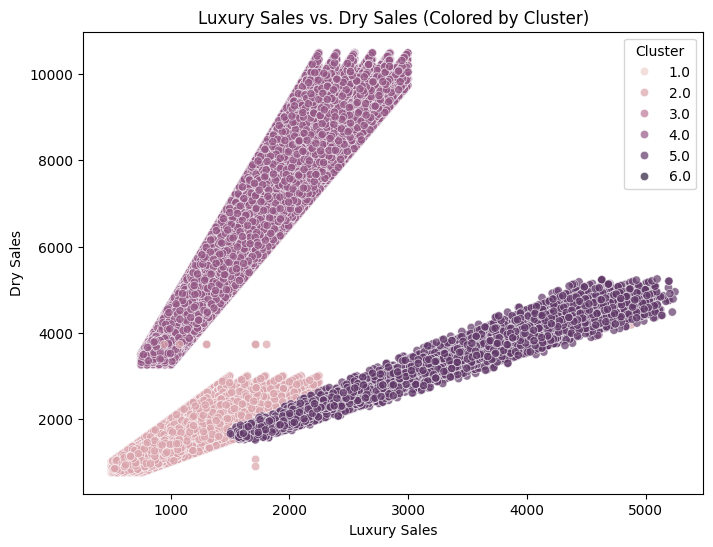

In [19]:
# Create the scatter plot
plt.figure(figsize=(8, 6))
# Replace 'cluster_catgeory' with the correct column name from your DataFrame.
# If the intended column name was 'cluster_category', the corrected code would be:
sns.scatterplot(data=train, x="luxury_sales", y="dry_sales", hue="cluster_category", alpha=0.7)
plt.legend(title="Cluster")
plt.title("Luxury Sales vs. Dry Sales (Colored by Cluster)")
plt.xlabel("Luxury Sales")
plt.ylabel("Dry Sales")
plt.legend(title="Cluster")
plt.show()